# Klasifikasi Pakaian dengan HOG + SVM

## 1. Setup

In [1]:
from collections import Counter
from itertools import combinations
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from matplotlib.patches import Patch, Rectangle
from PIL import Image, ImageOps
from pillow_heif import register_heif_opener
from skimage.feature import hog
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV, StratifiedGroupKFold, StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

register_heif_opener()  # agar PIL bisa membuka file .heic

# Lokasi data dan output
BASE_DIR = Path(r"C:\Semester 5\CV\SUBMISSION")
DATASET_DIR = BASE_DIR / "Dataset"                 # hanya dibaca
OUTPUT_DIR = BASE_DIR / "Training Model" / "results"
BEFORE_DIR = OUTPUT_DIR / "sebelum"
AFTER_DIR = OUTPUT_DIR / "sesudah"
for d in (OUTPUT_DIR, BEFORE_DIR, AFTER_DIR):
    d.mkdir(parents=True, exist_ok=True)

# Konfigurasi eksperimen
CLASSES = ["Kaos", "Topi", "Kemeja", "Celana"]
CLASS_COLORS = dict(zip(CLASSES, sns.color_palette("Set2", len(CLASSES))))
IMG_W, IMG_H = 192, 256   # ukuran input HOG, rasio 3:4 sama dengan foto asli (3000x4000)
LOAD_SCALE = 2            # citra disimpan 2x lebih besar (384x512) agar hasil crop tidak perlu di-upscale
N_SPLITS = 5              # stratified 5-fold untuk evaluasi (outer CV)
N_REPEATS = 5             # 5-fold CV diulang 5x dengan pengacakan berbeda
SEED = 42

## 2. Preprocessing

- `.heic` dibaca via `pillow-heif`, orientasi EXIF diterapkan, konversi RGB.
- Resize dengan menjaga aspect ratio (foto asli 3000x4000, rasio 3:4) ke 384x512; padding memakai replikasi tepi agar tidak menambah tepi palsu pada HOG.
- `center_crop_resize(img, margin)`: buang `margin` dari tiap sisi, lalu resize ke 192x256 (input HOG). `margin=0` = tanpa crop.

In [2]:
def letterbox(img, target_w, target_h):
    # Resize dengan menjaga aspect ratio, lalu padding (replikasi tepi) sampai ukuran target
    h, w = img.shape[:2]
    scale = min(target_w / w, target_h / h)
    new_w, new_h = round(w * scale), round(h * scale)
    resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
    pad_x, pad_y = target_w - new_w, target_h - new_h
    return cv2.copyMakeBorder(resized, pad_y // 2, pad_y - pad_y // 2,
                              pad_x // 2, pad_x - pad_x // 2, cv2.BORDER_REPLICATE)


def load_image(path):
    img = ImageOps.exif_transpose(Image.open(path)).convert("RGB")
    return letterbox(np.asarray(img), IMG_W * LOAD_SCALE, IMG_H * LOAD_SCALE)


def center_crop_resize(img, margin=0.0):
    # Buang `margin` (proporsi, mis. 0.1 = 10%) dari tiap sisi, lalu resize ke ukuran input HOG.
    # Margin sama untuk lebar dan tinggi, jadi rasio 3:4 tetap terjaga.
    h, w = img.shape[:2]
    dx, dy = round(w * margin), round(h * margin)
    return cv2.resize(img[dy:h - dy, dx:w - dx], (IMG_W, IMG_H), interpolation=cv2.INTER_AREA)


images_full, labels, filenames = [], [], []
for cls in CLASSES:
    # Urutkan secara numerik: Kaos_1, Kaos_2, ..., Kaos_10 (bukan Kaos_1, Kaos_10, Kaos_2)
    paths = sorted((DATASET_DIR / cls).glob("*.heic"), key=lambda p: int(p.stem.split("_")[-1]))
    for p in paths:
        images_full.append(load_image(p))
        labels.append(cls)
        filenames.append(p.name)

images_full = np.stack(images_full)                               # (90, 512, 384, 3)
images = np.stack([center_crop_resize(im) for im in images_full])  # (90, 256, 192, 3), tanpa crop
labels = np.array(labels)        # label kelas tiap citra
filenames = np.array(filenames)  # nama file asli tiap citra

print("Bentuk array citra:", images.shape)
for cls, n in Counter(labels).items():
    print(f"  {cls:<7}: {n} citra")

Bentuk array citra: (90, 256, 192, 3)
  Kaos   : 20 citra
  Topi   : 32 citra
  Kemeja : 15 citra
  Celana : 23 citra


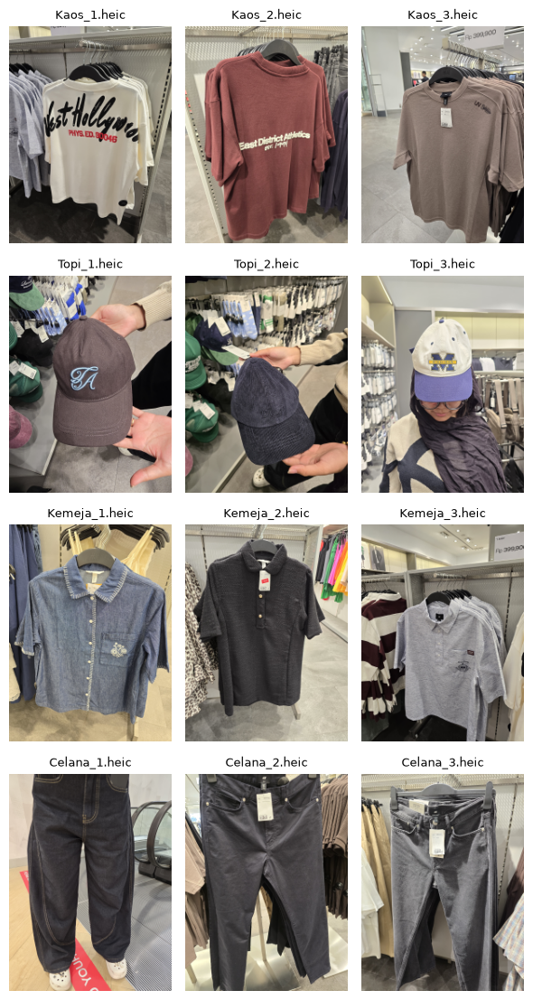

In [3]:
# Contoh 3 citra per kelas setelah preprocessing (bisa dipakai di laporan)
fig, axes = plt.subplots(len(CLASSES), 3, figsize=(6, 2.8 * len(CLASSES)))
for row, cls in enumerate(CLASSES):
    for col, idx in enumerate(np.where(labels == cls)[0][:3]):
        axes[row, col].imshow(images[idx])
        axes[row, col].set_title(filenames[idx], fontsize=9)
        axes[row, col].axis("off")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "sample_images.png", dpi=150)
plt.show()

## 3. Ekstraksi Fitur

- **HOG**: grayscale, sel 16x16 px, 9 orientasi, blok 2x2 sel, normalisasi L2-Hys -> 11 x 15 blok x 36 = **5940 dimensi**.
- **Color histogram HSV**: 8x4x4 bin = **128 dimensi**, dinormalisasi (jumlah = 1). Dipakai sebagai pembanding.
- Pada `HOG + Color`, warna hanya 128 dari 6068 dimensi, sehingga kontribusinya kecil setelah standardisasi.

In [4]:
HOG_PARAMS = dict(orientations=9, pixels_per_cell=(16, 16), cells_per_block=(2, 2), block_norm="L2-Hys")
COLOR_BINS = (8, 4, 4)  # bin untuk H, S, V


def extract_hog(img_rgb):
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    return hog(gray, **HOG_PARAMS)


def extract_color_hist(img_rgb):
    hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)  # OpenCV: H 0-179, S dan V 0-255
    hist = cv2.calcHist([hsv], [0, 1, 2], None, list(COLOR_BINS), [0, 180, 0, 256, 0, 256])
    return (hist / hist.sum()).flatten()


X_hog = np.array([extract_hog(img) for img in images])
X_color = np.array([extract_color_hist(img) for img in images])

FEATURE_SETS = {
    "HOG": X_hog,
    "Color histogram": X_color,
    "HOG + Color": np.hstack([X_hog, X_color]),
}
for name, X in FEATURE_SETS.items():
    print(f"{name:<16}: {X.shape}")

HOG             : (90, 5940)
Color histogram : (90, 128)
HOG + Color     : (90, 6068)


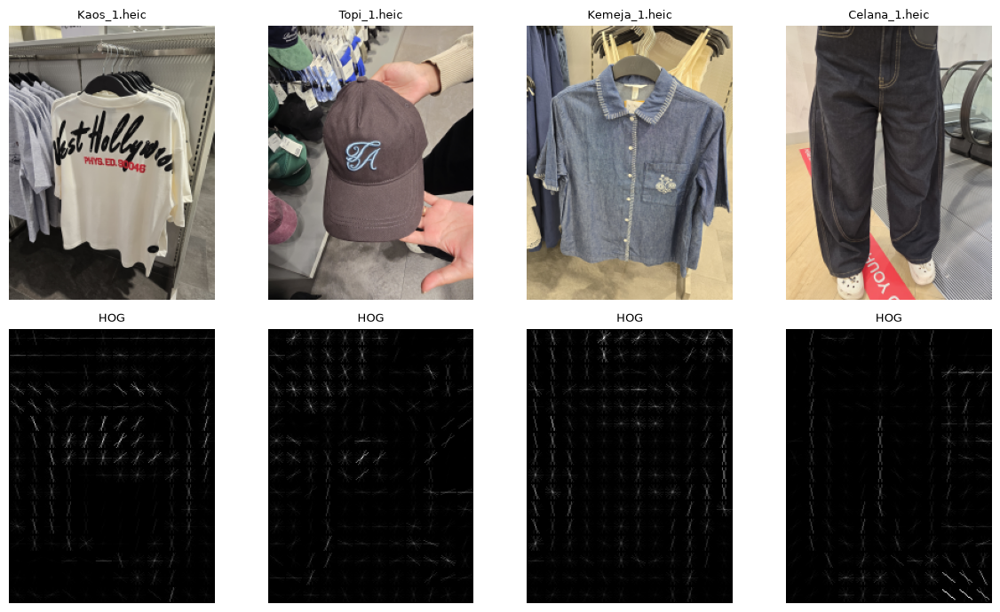

In [5]:
# Visualisasi HOG untuk satu contoh per kelas: menunjukkan bentuk apa yang "dilihat" oleh fitur HOG
fig, axes = plt.subplots(2, len(CLASSES), figsize=(3 * len(CLASSES), 7))
for col, cls in enumerate(CLASSES):
    idx = np.where(labels == cls)[0][0]
    gray = cv2.cvtColor(images[idx], cv2.COLOR_RGB2GRAY)
    _, hog_img = hog(gray, visualize=True, **HOG_PARAMS)
    axes[0, col].imshow(images[idx])
    axes[0, col].set_title(filenames[idx], fontsize=9)
    axes[1, col].imshow(hog_img, cmap="gray")
    axes[1, col].set_title("HOG", fontsize=9)
    axes[0, col].axis("off")
    axes[1, col].axis("off")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "hog_visualization.png", dpi=150)
plt.show()

## 4. Modeling

- Pipeline: `StandardScaler` -> (opsional `PCA`) -> `SVC(class_weight="balanced")`.
  - Scaler di dalam pipeline sehingga di-fit hanya pada data training tiap fold.
  - `SVC` multi-kelas memakai **one-vs-one** (6 classifier biner untuk 4 kelas).
- Grid search: `kernel` {linear, rbf} x `C` {0.01, 0.1, 1, 10, 100}; dengan PCA ditambah `n_components` {0.80, 0.95} (proporsi varians).
- **Repeated nested CV**: outer stratified 5-fold (evaluasi) x inner 4-fold (tuning, hanya data training), diulang 5x -> tiap citra diprediksi 5x sebagai data uji.
- Inner CV memakai `StratifiedGroupKFold` agar citra asli dan salinan augmentasinya tidak terpisah ke fold berbeda.
- **Margin keyakinan** = |skor SVM biner one-vs-one antara kelas prediksi dan kelas runner-up|, yaitu jarak ke batas keputusan.

In [6]:
BASE_GRID = {"svm__kernel": ["linear", "rbf"], "svm__C": [0.01, 0.1, 1, 10, 100]}
PCA_COMPONENTS = [0.80, 0.95]  # proporsi varians yang dipertahankan PCA


def make_grid_search(use_pca=False):
    steps = [("scaler", StandardScaler())]  # standardisasi tiap fitur (mean 0, std 1)
    grid = dict(BASE_GRID)
    if use_pca:
        steps.append(("pca", PCA(svd_solver="full", random_state=SEED)))
        grid["pca__n_components"] = PCA_COMPONENTS
    steps.append(("svm", SVC(class_weight="balanced")))
    inner_cv = StratifiedGroupKFold(n_splits=4, shuffle=True, random_state=SEED)
    return GridSearchCV(Pipeline(steps), grid, cv=inner_cv, scoring="accuracy", n_jobs=-1)


def ovo_margin(model, X, pred):
    # Margin keyakinan = |skor SVM biner (one-vs-one) antara kelas prediksi dan kelas runner-up|
    svm = model.named_steps["svm"]
    classes = list(svm.classes_)
    ovr = model.decision_function(X)           # (n, 4): skor per kelas, dipakai untuk mencari runner-up
    svm.set_params(decision_function_shape="ovo")
    ovo = model.decision_function(X)           # (n, 6): skor tiap classifier biner, urutan pasangan combinations()
    svm.set_params(decision_function_shape="ovr")
    pair_col = {pair: k for k, pair in enumerate(combinations(range(len(classes)), 2))}
    margins = np.empty(len(X))
    for n, p in enumerate(pred):
        top = classes.index(p)
        ranked = [c for c in np.argsort(ovr[n])[::-1] if c != top]
        margins[n] = abs(ovo[n, pair_col[tuple(sorted((top, ranked[0])))]])
    return margins


def repeated_nested_cv(X, y, use_pca=False, aug=None):
    # aug = (X_aug, y_aug, src): fitur citra augmentasi, labelnya, dan indeks citra asalnya
    preds = np.empty((N_REPEATS, len(y)), dtype=y.dtype)  # preds[r, i] = prediksi citra i pada ulangan r
    margins = np.zeros((N_REPEATS, len(y)))               # margin keyakinan tiap prediksi
    fold_acc, best_params = [], []
    for r in range(N_REPEATS):
        outer_cv = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=r)
        for train_idx, test_idx in outer_cv.split(X, y):
            X_tr, y_tr, groups = X[train_idx], y[train_idx], train_idx
            if aug is not None:
                # Tambahkan augmentasi HANYA dari citra training; salinan citra uji tidak ikut
                X_aug, y_aug, src = aug
                keep = np.isin(src, train_idx)
                X_tr = np.vstack([X_tr, X_aug[keep]])
                y_tr = np.concatenate([y_tr, y_aug[keep]])
                groups = np.concatenate([groups, src[keep]])
            gs = make_grid_search(use_pca).fit(X_tr, y_tr, groups=groups)  # tuning hanya di data training
            preds[r, test_idx] = gs.predict(X[test_idx])                    # prediksi data uji
            margins[r, test_idx] = ovo_margin(gs.best_estimator_, X[test_idx], preds[r, test_idx])
            fold_acc.append(accuracy_score(y[test_idx], preds[r, test_idx]))
            best_params.append(", ".join(f"{k.split('__')[1]}={v}" for k, v in sorted(gs.best_params_.items())))
    return {"preds": preds, "margins": margins, "fold_acc": np.array(fold_acc), "best_params": best_params}

## 5. Fungsi Evaluasi, Visualisasi, dan Diagnostik

Diagnostik keyakinan: batas "yakin" = median margin prediksi benar.
- Salah dengan margin >= batas: **yakin tapi salah** (indikasi fitur bermasalah, mis. latar belakang ikut terekstraksi).
- Salah dengan margin < batas: **ragu-ragu** (indikasi batas antar kelas tipis).

In [7]:
def md_table(headers, rows):
    lines = ["| " + " | ".join(headers) + " |", "|" + "---|" * len(headers)]
    lines += ["| " + " | ".join(str(x) for x in row) + " |" for row in rows]
    return "\n".join(lines)


def evaluate(res, out_dir, title, intro_lines=()):
    y_true_all = np.tile(labels, N_REPEATS)  # label asli, diulang sesuai jumlah ulangan
    y_pred_all = res["preds"].ravel()        # prediksi, urutan sama dengan y_true_all
    report_text = classification_report(y_true_all, y_pred_all, labels=CLASSES, digits=3, zero_division=0)
    report = classification_report(y_true_all, y_pred_all, labels=CLASSES, output_dict=True, zero_division=0)
    cm = confusion_matrix(y_true_all, y_pred_all, labels=CLASSES)
    acc = res["fold_acc"]
    print(f"{title}: akurasi {acc.mean():.3f} +/- {acc.std():.3f}\n")
    print(report_text)

    # --- Confusion matrix (jumlah dan persentase per kelas asli) ---
    cm_pct = cm / cm.sum(axis=1, keepdims=True) * 100
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=CLASSES, yticklabels=CLASSES, ax=axes[0])
    axes[0].set_title("Jumlah prediksi")
    sns.heatmap(cm_pct, annot=True, fmt=".1f", cmap="Blues", xticklabels=CLASSES, yticklabels=CLASSES,
                vmin=0, vmax=100, ax=axes[1])
    axes[1].set_title("Persentase per kelas asli (%)")
    for ax in axes:
        ax.set_xlabel("Prediksi")
        ax.set_ylabel("Aktual")
    fig.suptitle(f"Confusion Matrix - {title} ({N_REPEATS}x {N_SPLITS}-fold CV, {len(y_true_all)} prediksi)")
    plt.tight_layout()
    plt.savefig(out_dir / "confusion_matrix.png", dpi=200)
    plt.show()

    # --- Citra yang pernah salah, diurutkan dari yang paling sering salah ---
    wrong_mask = res["preds"] != labels     # (N_REPEATS, 90): True jika salah
    wrong_count = wrong_mask.sum(axis=0)    # berapa kali tiap citra salah
    majority_wrong = wrong_count > N_REPEATS / 2  # salah di lebih dari separuh ulangan
    # Label yang ditampilkan: prediksi salah tersering jika mayoritas salah, selain itu label asli (benar)
    shown_pred = np.array([Counter(res["preds"][:, i][wrong_mask[:, i]]).most_common(1)[0][0] if majority_wrong[i]
                           else labels[i] for i in range(len(labels))])
    conf_threshold = np.median(res["margins"][~wrong_mask])  # batas "yakin" = median margin prediksi benar

    mis_idx = sorted(np.where(wrong_count > 0)[0], key=lambda i: (-wrong_count[i], labels[i]))
    mis_rows = []
    for i in mis_idx:
        wrong_preds = Counter(res["preds"][:, i][wrong_mask[:, i]])
        mean_margin = res["margins"][:, i][wrong_mask[:, i]].mean()
        mis_rows.append((filenames[i], labels[i],
                         ", ".join(f"{c} ({n}x)" for c, n in wrong_preds.most_common()),
                         f"{wrong_count[i]}/{N_REPEATS}", f"{mean_margin:.2f}",
                         "yakin tapi salah" if mean_margin >= conf_threshold else "ragu-ragu"))

    # --- Pasangan kelas yang paling sering tertukar (dua arah) ---
    pairs = []
    for a in range(len(CLASSES)):
        for b in range(a + 1, len(CLASSES)):
            pairs.append((CLASSES[a], CLASSES[b], cm[a, b], cm[b, a]))
    pairs.sort(key=lambda t: t[2] + t[3], reverse=True)

    # --- Kesalahan per arah (aktual -> prediksi): jumlah, margin, dan proporsi "yakin tapi salah" ---
    is_err = y_pred_all != y_true_all
    err_true, err_pred, err_margin = y_true_all[is_err], y_pred_all[is_err], res["margins"].ravel()[is_err]
    direction_rows = []
    for (t, p), n in Counter(zip(err_true, err_pred)).most_common():
        m = err_margin[(err_true == t) & (err_pred == p)]
        direction_rows.append((f"{t} -> {p}", n, f"{np.median(m):.2f}", f"{(m >= conf_threshold).mean() * 100:.0f}%"))

    f1 = {c: report[c]["f1-score"] for c in CLASSES}
    easiest, hardest = max(f1, key=f1.get), min(f1, key=f1.get)
    n_confident_wrong = int((err_margin >= conf_threshold).sum())

    out = [
        f"# Hasil Klasifikasi Pakaian - {title}",
        "",
        *intro_lines,
        "",
        "## Akurasi Cross-Validation",
        f"**{acc.mean():.3f} +/- {acc.std():.3f}** (rata-rata +/- std dari {len(acc)} fold uji)",
        "",
        "Hyperparameter terpilih di tiap outer fold: "
        + "; ".join(f"`{p}` ({n}x)" for p, n in Counter(res["best_params"]).most_common()),
        "",
        f"## Classification Report (akumulasi {len(y_true_all)} prediksi out-of-fold)",
        "```",
        report_text.rstrip(),
        "```",
        "",
        "## Confusion Matrix",
        "Baris = kelas aktual, kolom = kelas prediksi. Gambar: `confusion_matrix.png`",
        "",
        md_table(["Aktual \\ Prediksi"] + CLASSES, [[c] + list(cm[i]) for i, c in enumerate(CLASSES)]),
        "",
        "## Citra yang Salah Diklasifikasikan",
        f"{len(mis_idx)} dari {len(labels)} citra pernah salah (dari {N_REPEATS} kali diprediksi sebagai data uji). "
        f"Kolom margin = rata-rata margin keyakinan saat salah; batas yakin = {conf_threshold:.2f} "
        "(median margin prediksi benar).",
        "",
        md_table(["File", "Kelas asli", "Diprediksi sebagai", "Frekuensi salah", "Margin saat salah", "Kategori"],
                 mis_rows),
        "",
        "## Kelas Paling Mudah dan Paling Sulit Dipisahkan",
        md_table(["Kelas", "Precision", "Recall", "F1-score"],
                 [(c, f"{report[c]['precision']:.3f}", f"{report[c]['recall']:.3f}", f"{f1[c]:.3f}") for c in CLASSES]),
        "",
        f"- Kelas paling mudah dikenali (F1 tertinggi): **{easiest}** ({f1[easiest]:.3f})",
        f"- Kelas paling sulit dikenali (F1 terendah): **{hardest}** ({f1[hardest]:.3f})",
        "",
        md_table(["Pasangan", "Total tertukar", "A -> B", "B -> A"],
                 [(f"{a} <-> {b}", ab + ba, f"{a}->{b}: {ab}", f"{b}->{a}: {ba}") for a, b, ab, ba in pairs]),
        "",
        f"- Paling sulit dipisahkan: **{pairs[0][0]} vs {pairs[0][1]}** ({pairs[0][2] + pairs[0][3]} kali tertukar)",
        f"- Paling mudah dipisahkan: **{pairs[-1][0]} vs {pairs[-1][1]}** ({pairs[-1][2] + pairs[-1][3]} kali tertukar)",
        "",
        "## Diagnostik Keyakinan Model",
        f"Dari {len(err_margin)} prediksi salah, **{n_confident_wrong} ({n_confident_wrong / len(err_margin) * 100:.0f}%)** "
        f"termasuk *yakin tapi salah* (margin >= {conf_threshold:.2f}), sisanya *ragu-ragu*.",
        "",
        md_table(["Arah kesalahan", "Jumlah", "Median margin", "% yakin tapi salah"], direction_rows),
        "",
        "Grafik: `diag_1_error_rate_per_kelas.png`, `diag_2_breakdown_kesalahan.png`, "
        "`diag_3_scaling_hog.png`, `diag_4_confidence.png`, `prediction_visualization.png`",
    ]
    (out_dir / "results.md").write_text("\n".join(out), encoding="utf-8")
    print("Tersimpan:", out_dir / "results.md")

    return {"report": report, "cm": cm, "wrong_mask": wrong_mask, "wrong_count": wrong_count,
            "majority_wrong": majority_wrong, "shown_pred": shown_pred, "mis_idx": mis_idx, "conf_threshold": conf_threshold}

In [8]:
def plot_predictions(ev, display_images, out_dir, title):
    # Semua citra yang pernah salah + 2 citra yang selalu benar per kelas
    rng = np.random.default_rng(SEED)
    wrong_count, majority_wrong, shown_pred = ev["wrong_count"], ev["majority_wrong"], ev["shown_pred"]
    show_idx = list(ev["mis_idx"])
    for cls in CLASSES:
        always_correct = np.where((labels == cls) & (wrong_count == 0))[0]
        show_idx += list(rng.choice(always_correct, size=min(2, len(always_correct)), replace=False))
    show_idx = sorted(set(show_idx), key=lambda i: (CLASSES.index(labels[i]), -wrong_count[i]))

    n_cols = 6
    n_rows = int(np.ceil(len(show_idx) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 2.6, n_rows * 4.2), layout="constrained")
    fig.get_layout_engine().set(h_pad=0.2)  # jarak vertikal antar baris agar teks tidak berdempet
    axes = np.atleast_2d(axes)
    for ax in axes.flat:
        ax.axis("off")

    for ax, i in zip(axes.flat, show_idx):
        if wrong_count[i] == 0:
            color = "green"
        elif majority_wrong[i]:
            color = "red"
        else:
            color = "orange"
        ax.axis("on")
        ax.imshow(display_images[i])
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():  # border berwarna sebagai penanda benar/salah
            spine.set_edgecolor(color)
            spine.set_linewidth(6)
        ax.set_title(f"{filenames[i]}\nAktual: {labels[i]}", fontsize=10)
        ax.set_xlabel(f"Prediksi: {shown_pred[i]}\nsalah {wrong_count[i]}/{N_REPEATS}",
                      fontsize=10, color=color, fontweight="bold")

    fig.legend(handles=[Patch(color="green", label="Selalu benar"),
                        Patch(color="orange", label="Kadang salah (mayoritas benar)"),
                        Patch(color="red", label=f"Mayoritas salah (>{N_REPEATS // 2}/{N_REPEATS})")],
               loc="outside lower center", ncol=3, fontsize=11)
    fig.suptitle(f"Hasil Prediksi - {title} (out-of-fold, {N_REPEATS}x {N_SPLITS}-fold CV)", fontsize=14)
    plt.savefig(out_dir / "prediction_visualization.png", dpi=150)
    plt.show()

In [9]:
def plot_diagnostics(res, ev, X_features, out_dir, title):
    cm, wrong_mask, threshold = ev["cm"], ev["wrong_mask"], ev["conf_threshold"]
    x = np.arange(len(CLASSES))

    # --- Diagnostik 1: akurasi vs error rate per kelas ---
    acc_cls = cm.diagonal() / cm.sum(axis=1) * 100
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.bar(x, acc_cls, color="#4caf50", label="Benar")
    ax.bar(x, 100 - acc_cls, bottom=acc_cls, color="#e53935", label="Salah (error rate)")
    for xi, a in zip(x, acc_cls):
        ax.text(xi, a / 2, f"{a:.1f}%", ha="center", va="center", color="white", fontweight="bold")
        if a < 97:
            ax.text(xi, a + (100 - a) / 2, f"{100 - a:.1f}%", ha="center", va="center", color="white", fontweight="bold")
    ax.set_xticks(x, [f"{c}\n(n={cm[i].sum()})" for i, c in enumerate(CLASSES)])
    ax.set_ylabel("Persentase prediksi (%)")
    ax.set_ylim(0, 100)
    ax.set_title(f"Akurasi & Error Rate per Kelas - {title}")
    ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.15), ncol=2)
    plt.tight_layout()
    plt.savefig(out_dir / "diag_1_error_rate_per_kelas.png", dpi=200)
    plt.show()

    # --- Diagnostik 2: breakdown kesalahan (ke kelas mana citra tiap kelas salah diprediksi) ---
    errors = cm.copy()
    np.fill_diagonal(errors, 0)
    n_err = errors.sum(axis=1)
    err_pct = errors / np.maximum(n_err, 1)[:, None] * 100
    fig, ax = plt.subplots(figsize=(8, 5))
    bottom = np.zeros(len(CLASSES))
    for j, pred_cls in enumerate(CLASSES):
        ax.bar(x, err_pct[:, j], bottom=bottom, color=CLASS_COLORS[pred_cls], label=f"Diprediksi {pred_cls}")
        for i in range(len(CLASSES)):
            if err_pct[i, j] >= 5:
                ax.text(i, bottom[i] + err_pct[i, j] / 2, f"{err_pct[i, j]:.0f}%\n({errors[i, j]})",
                        ha="center", va="center", fontsize=9)
        bottom += err_pct[:, j]
    ax.set_xticks(x, [f"Aktual: {c}\n({n_err[i]} salah)" for i, c in enumerate(CLASSES)])
    ax.set_ylabel("Persentase dari kesalahan kelas tsb (%)")
    ax.set_ylim(0, 100)
    ax.set_title(f"Breakdown Kesalahan per Kelas Aktual - {title}")
    ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.18), ncol=4, fontsize=9)
    plt.tight_layout()
    plt.savefig(out_dir / "diag_2_breakdown_kesalahan.png", dpi=200)
    plt.show()

    # --- Diagnostik 3: distribusi nilai fitur HOG sebelum vs sesudah StandardScaler ---
    # Scaler di sini di-fit pada seluruh data hanya untuk pengecekan; saat training, scaler di-fit per fold.
    X_scaled = StandardScaler().fit_transform(X_features)
    feat_std_before = X_features.std(axis=0)
    fig, axes = plt.subplots(1, 3, figsize=(16, 4.5))
    axes[0].hist(X_features.ravel(), bins=100, color="#607d8b")
    axes[0].set_title("Nilai fitur HOG sebelum scaling")
    axes[0].set_xlabel("Nilai fitur")
    axes[1].hist(np.clip(X_scaled.ravel(), -4, 8), bins=100, color="#1e88e5")
    axes[1].set_title("Sesudah StandardScaler (nilai di-clip ke [-4, 8] untuk tampilan)")
    axes[1].set_xlabel("Nilai fitur (z-score)")
    axes[2].hist(feat_std_before, bins=60, color="#607d8b", label="Std per fitur sebelum scaling")
    axes[2].axvline(1.0, color="#1e88e5", lw=2, ls="--", label="Std per fitur sesudah scaling (=1)")
    axes[2].set_title("Std tiap dimensi fitur")
    axes[2].set_xlabel("Standar deviasi")
    axes[2].legend(fontsize=9)
    for ax in axes:
        ax.set_ylabel("Jumlah")
    fig.suptitle(f"Pengecekan Feature Scaling HOG - {title}")
    plt.tight_layout()
    plt.savefig(out_dir / "diag_3_scaling_hog.png", dpi=200)
    plt.show()
    print(f"Sebelum scaling: mean {X_features.mean():.4f}, std per fitur {feat_std_before.min():.4f}-{feat_std_before.max():.4f}")
    print(f"Sesudah scaling: rata-rata mean per fitur {X_scaled.mean(axis=0).mean():.2e}, "
          f"rata-rata std per fitur {X_scaled.std(axis=0).mean():.3f}")

    # --- Diagnostik 4: margin keyakinan SVM untuk prediksi benar vs salah ---
    margins = res["margins"]
    y_true_all = np.tile(labels, N_REPEATS)
    wrong_flat = wrong_mask.ravel()
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    bins = np.linspace(0, margins.max(), 30)
    axes[0].hist(margins[~wrong_mask], bins=bins, density=True, alpha=0.6, color="#4caf50",
                 label=f"Benar (n={(~wrong_mask).sum()})")
    axes[0].hist(margins[wrong_mask], bins=bins, density=True, alpha=0.6, color="#e53935",
                 label=f"Salah (n={wrong_mask.sum()})")
    axes[0].axvline(threshold, color="black", ls="--", label=f"Batas yakin = {threshold:.2f}")
    axes[0].set_xlabel("Margin keyakinan (|skor SVM one-vs-one| prediksi vs runner-up)")
    axes[0].set_ylabel("Densitas")
    axes[0].set_title("Distribusi margin: benar vs salah")
    axes[0].legend()

    err_margin = margins.ravel()[wrong_flat]
    err_true = y_true_all[wrong_flat]
    confident = np.array([((err_true == c) & (err_margin >= threshold)).sum() for c in CLASSES])
    unsure = np.array([((err_true == c) & (err_margin < threshold)).sum() for c in CLASSES])
    axes[1].bar(x, confident, color="#b71c1c", label="Yakin tapi salah (fitur bermasalah?)")
    axes[1].bar(x, unsure, bottom=confident, color="#ffb74d", label="Ragu-ragu (batas kelas tipis?)")
    for xi, c, u in zip(x, confident, unsure):
        if c:
            axes[1].text(xi, c / 2, str(c), ha="center", va="center", color="white", fontweight="bold")
        if u:
            axes[1].text(xi, c + u / 2, str(u), ha="center", va="center", fontweight="bold")
    axes[1].set_xticks(x, [f"Aktual: {c}" for c in CLASSES])
    axes[1].set_ylabel("Jumlah prediksi salah")
    axes[1].set_title("Jenis kesalahan per kelas aktual")
    axes[1].legend()
    fig.suptitle(f"Keyakinan Model SVM - {title}")
    plt.tight_layout()
    plt.savefig(out_dir / "diag_4_confidence.png", dpi=200)
    plt.show()

## 6. Sebelum Perbaikan

HOG citra utuh, tanpa augmentasi, tanpa PCA.

In [10]:
# Jalankan evaluasi untuk ketiga set fitur
cv_results = {}
for name, X in FEATURE_SETS.items():
    cv_results[name] = repeated_nested_cv(X, labels)
    acc = cv_results[name]["fold_acc"]
    print(f"{name:<16}: akurasi {acc.mean():.3f} +/- {acc.std():.3f}  ({len(acc)} fold)")

HOG             : akurasi 0.833 +/- 0.087  (25 fold)


Color histogram : akurasi 0.464 +/- 0.077  (25 fold)


HOG + Color     : akurasi 0.836 +/- 0.092  (25 fold)


In [11]:
# Grid search pada seluruh data (fitur HOG) untuk melihat pengaruh kernel dan C.
# Tabel ini untuk analisis hyperparameter; angka akurasi utama tetap dari nested CV.
final_gs = make_grid_search().fit(X_hog, labels, groups=np.arange(len(labels)))
grid_rows = [
    (p["svm__kernel"], p["svm__C"], f"{m:.3f}", f"{s:.3f}")
    for p, m, s in zip(final_gs.cv_results_["params"],
                       final_gs.cv_results_["mean_test_score"],
                       final_gs.cv_results_["std_test_score"])
]
print(md_table(["Kernel", "C", "Akurasi", "Std"], grid_rows))
print("\nParameter terbaik (seluruh data):", final_gs.best_params_)

| Kernel | C | Akurasi | Std |
|---|---|---|---|
| linear | 0.01 | 0.822 | 0.055 |
| rbf | 0.01 | 0.269 | 0.095 |
| linear | 0.1 | 0.822 | 0.055 |
| rbf | 0.1 | 0.421 | 0.057 |
| linear | 1 | 0.822 | 0.055 |
| rbf | 1 | 0.788 | 0.070 |
| linear | 10 | 0.822 | 0.055 |
| rbf | 10 | 0.766 | 0.052 |
| linear | 100 | 0.822 | 0.055 |
| rbf | 100 | 0.766 | 0.052 |

Parameter terbaik (seluruh data): {'svm__C': 0.01, 'svm__kernel': 'linear'}


Sebelum Perbaikan (HOG + SVM): akurasi 0.833 +/- 0.087

              precision    recall  f1-score   support

        Kaos      0.811     0.770     0.790       100
        Topi      0.880     0.963     0.919       160
      Kemeja      0.655     0.480     0.554        75
      Celana      0.864     0.939     0.900       115

    accuracy                          0.833       450
   macro avg      0.802     0.788     0.791       450
weighted avg      0.823     0.833     0.825       450



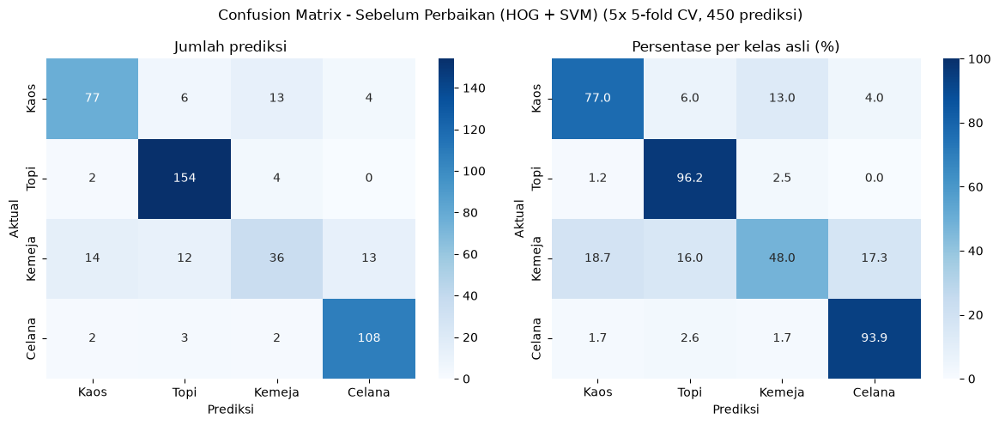

Tersimpan: C:\Semester 5\CV\SUBMISSION\Training Model\results\sebelum\results.md


In [12]:
hog_acc = cv_results["HOG"]["fold_acc"].mean()
before_intro = [
    "## Setup",
    f"- Dataset: {len(labels)} citra, " + ", ".join(f"{c} {n}" for c, n in Counter(labels).items()),
    f"- Preprocessing: RGB, resize {IMG_W}x{IMG_H} (aspect ratio 3:4), **tanpa crop**",
    f"- HOG: {HOG_PARAMS} -> {X_hog.shape[1]} dimensi",
    "- Model: StandardScaler + SVC (one-vs-one, class_weight=balanced), tanpa augmentasi, tanpa PCA",
    f"- Grid search: kernel {BASE_GRID['svm__kernel']}, C {BASE_GRID['svm__C']} (inner stratified 4-fold)",
    f"- Evaluasi: nested stratified {N_SPLITS}-fold CV, diulang {N_REPEATS}x ({N_SPLITS * N_REPEATS} fold uji)",
    "",
    "## Perbandingan Set Fitur",
    md_table(["Set fitur", "Dimensi", "Akurasi rata-rata", "Std", "Selisih vs HOG"],
             [(name, FEATURE_SETS[name].shape[1], f"{r['fold_acc'].mean():.3f}", f"{r['fold_acc'].std():.3f}",
               f"{(r['fold_acc'].mean() - hog_acc) * 100:+.1f} poin") for name, r in cv_results.items()]),
    "",
    "## Grid Search Kernel dan C (fitur HOG, seluruh data, inner 4-fold)",
    md_table(["Kernel", "C", "Akurasi rata-rata", "Std"], grid_rows),
    "",
    f"Parameter terbaik pada seluruh data: `{final_gs.best_params_}`",
]

BEFORE_TITLE = "Sebelum Perbaikan (HOG + SVM)"
res_before = cv_results["HOG"]
ev_before = evaluate(res_before, BEFORE_DIR, BEFORE_TITLE, before_intro)

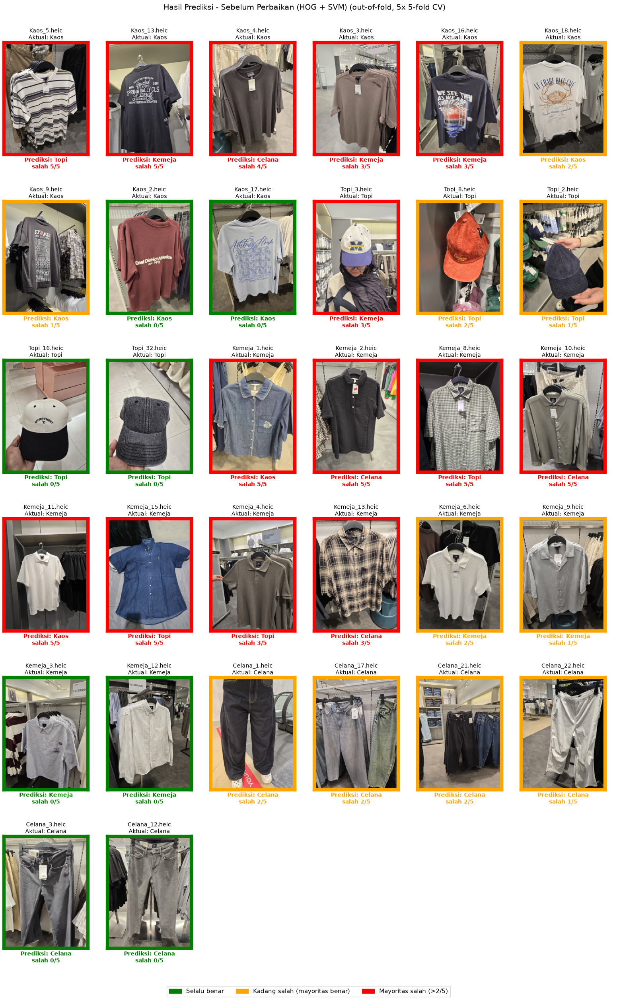

In [13]:
plot_predictions(ev_before, images, BEFORE_DIR, BEFORE_TITLE)

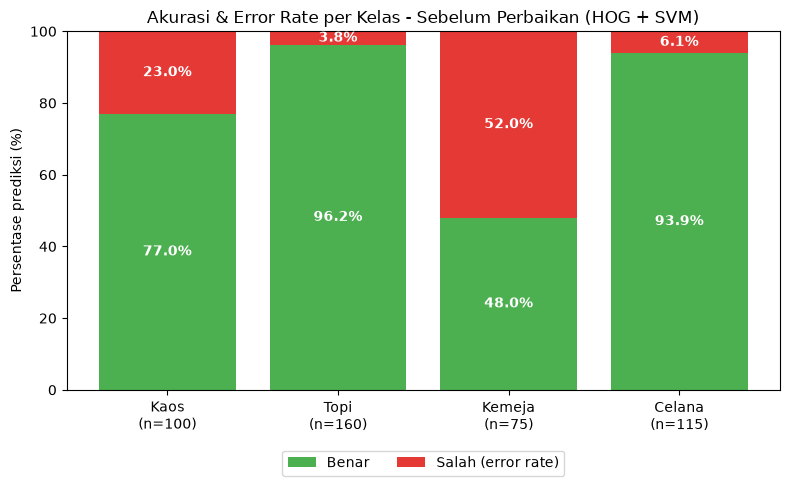

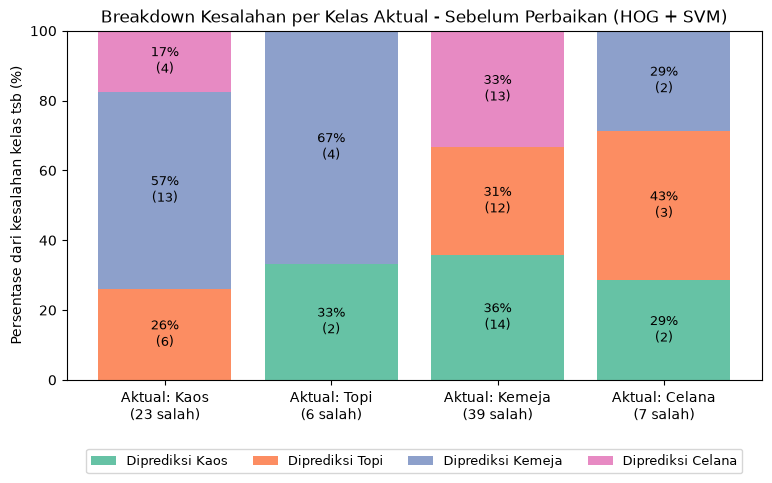

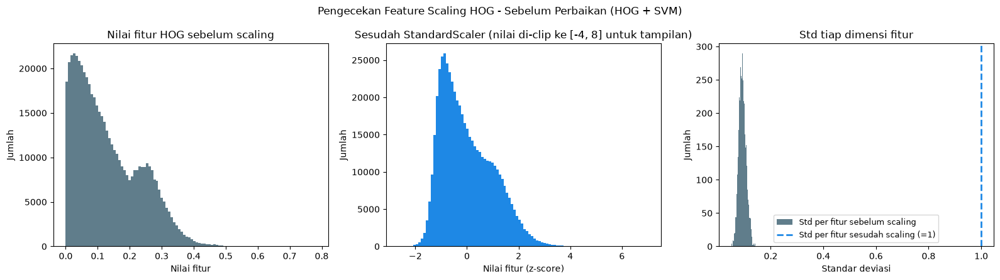

Sebelum scaling: mean 0.1335, std per fitur 0.0503-0.1422
Sesudah scaling: rata-rata mean per fitur 6.20e-18, rata-rata std per fitur 1.000


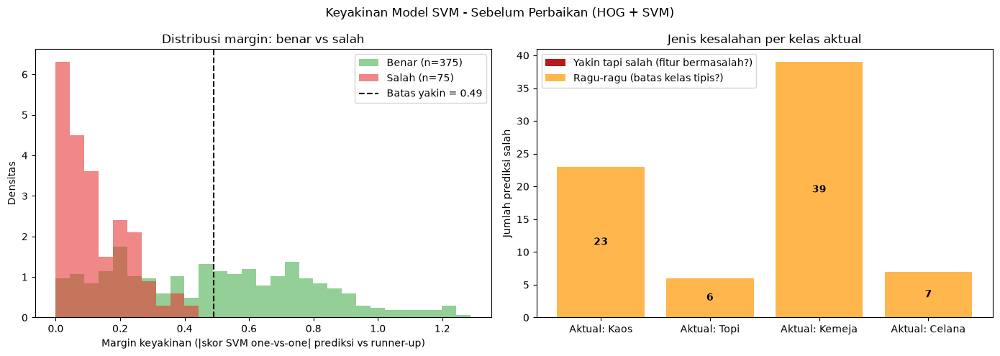

In [14]:
plot_diagnostics(res_before, ev_before, X_hog, BEFORE_DIR, BEFORE_TITLE)

## 7. Perbaikan Pipeline (Ablation Study)

- **Center crop**: margin 10% dan 20% tiap sisi; margin terbaik dipakai untuk langkah berikutnya.
- **Augmentasi Kemeja**: flip horizontal, rotasi acak +/-10 derajat (border replicate), brightness acak x0.7-1.3. Dibuat dari citra resolusi penuh sebelum crop, hanya dari citra training tiap fold.
- **PCA** sebelum SVM, `n_components` dipilih grid search.
- Konfigurasi terbaik dipilih dari data CV yang sama, jadi selisih di bawah std antar fold belum bisa dianggap peningkatan pasti.

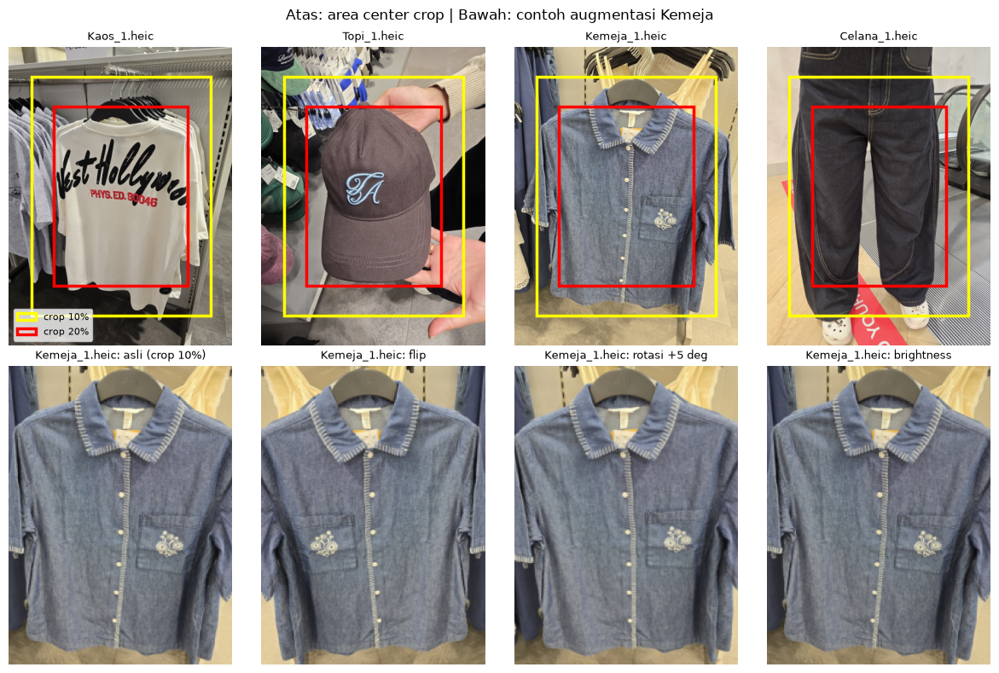

In [15]:
CROP_MARGINS = [0.10, 0.20]  # proporsi yang dibuang dari tiap sisi (knob yang bisa diubah)
AUG_CLASSES = ["Kemeja"]     # kelas yang diaugmentasi
AUG_MAX_ANGLE = 10           # derajat
AUG_BRIGHTNESS = (0.7, 1.3)  # faktor pengali brightness


def augment(img, rng):
    # Menghasilkan 3 variasi: flip horizontal, rotasi kecil, dan perubahan brightness
    h, w = img.shape[:2]
    angle = rng.uniform(-AUG_MAX_ANGLE, AUG_MAX_ANGLE)
    rot = cv2.getRotationMatrix2D((w / 2, h / 2), angle, 1.0)
    return {
        "flip": cv2.flip(img, 1),
        f"rotasi {angle:+.0f} deg": cv2.warpAffine(img, rot, (w, h), borderMode=cv2.BORDER_REPLICATE),
        "brightness": cv2.convertScaleAbs(img, alpha=rng.uniform(*AUG_BRIGHTNESS), beta=0),
    }


def build_augmented_features(margin):
    # Augmentasi dibuat dari citra resolusi penuh, lalu di-crop dan diekstrak HOG-nya
    rng = np.random.default_rng(SEED)
    X_aug, y_aug, src = [], [], []
    for i in np.where(np.isin(labels, AUG_CLASSES))[0]:
        for aug_img in augment(images_full[i], rng).values():
            X_aug.append(extract_hog(center_crop_resize(aug_img, margin)))
            y_aug.append(labels[i])
            src.append(i)  # indeks citra asal, agar salinan ikut split yang sama dengan aslinya
    return np.array(X_aug), np.array(y_aug), np.array(src)


# Contoh crop dan augmentasi untuk laporan
fig, axes = plt.subplots(2, len(CLASSES), figsize=(3 * len(CLASSES), 8))
for col, cls in enumerate(CLASSES):
    idx = np.where(labels == cls)[0][0]
    h, w = images_full[idx].shape[:2]
    axes[0, col].imshow(images_full[idx])
    for m, color in zip(CROP_MARGINS, ["yellow", "red"]):
        axes[0, col].add_patch(Rectangle((w * m, h * m), w * (1 - 2 * m), h * (1 - 2 * m),
                                         fill=False, edgecolor=color, lw=2.5, label=f"crop {m:.0%}"))
    axes[0, col].set_title(filenames[idx], fontsize=9)
axes[0, 0].legend(loc="lower left", fontsize=8)

kemeja_idx = np.where(labels == "Kemeja")[0][0]
examples = {"asli (crop 10%)": images_full[kemeja_idx], **augment(images_full[kemeja_idx], np.random.default_rng(SEED))}
for col, (name, img) in enumerate(examples.items()):
    axes[1, col].imshow(center_crop_resize(img, CROP_MARGINS[0]))
    axes[1, col].set_title(f"{filenames[kemeja_idx]}: {name}", fontsize=9)
for ax in axes.flat:
    ax.axis("off")
fig.suptitle("Atas: area center crop | Bawah: contoh augmentasi Kemeja")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "crop_augmentation_examples.png", dpi=150)
plt.show()

In [16]:
# Ablation study: tambahkan perbaikan satu per satu (semua memakai fitur HOG)
ablation = {"Baseline (tanpa crop)": res_before}
crop_features = {}

# (a) Center crop dengan beberapa margin
for m in CROP_MARGINS:
    crop_features[m] = np.array([extract_hog(center_crop_resize(im, m)) for im in images_full])
    ablation[f"Crop {m:.0%}"] = repeated_nested_cv(crop_features[m], labels)
    print(f"Crop {m:.0%}: {ablation[f'Crop {m:.0%}']['fold_acc'].mean():.3f}")

best_margin = max(CROP_MARGINS, key=lambda m: ablation[f"Crop {m:.0%}"]["fold_acc"].mean())
X_crop = crop_features[best_margin]
aug_data = build_augmented_features(best_margin)
crop_name = f"Crop {best_margin:.0%}"
print(f"Margin crop terbaik: {best_margin:.0%}; jumlah citra augmentasi: {len(aug_data[0])}")

# (b) Crop + augmentasi, crop + PCA, crop + augmentasi + PCA
ablation[f"{crop_name} + Augmentasi Kemeja"] = repeated_nested_cv(X_crop, labels, aug=aug_data)
ablation[f"{crop_name} + PCA"] = repeated_nested_cv(X_crop, labels, use_pca=True)
ablation[f"{crop_name} + Augmentasi Kemeja + PCA"] = repeated_nested_cv(X_crop, labels, use_pca=True, aug=aug_data)

base_acc = res_before["fold_acc"].mean()
ablation_rows = [
    (name, f"{r['fold_acc'].mean():.3f}", f"{r['fold_acc'].std():.3f}",
     f"{(r['fold_acc'].mean() - base_acc) * 100:+.1f} poin",
     f"{classification_report(np.tile(labels, N_REPEATS), r['preds'].ravel(), output_dict=True, zero_division=0)['Kemeja']['f1-score']:.3f}")
    for name, r in ablation.items()
]
print(md_table(["Konfigurasi", "Akurasi", "Std", "Selisih vs baseline", "F1 Kemeja"], ablation_rows))

Crop 10%: 0.851


Crop 20%: 0.862


Margin crop terbaik: 20%; jumlah citra augmentasi: 45


| Konfigurasi | Akurasi | Std | Selisih vs baseline | F1 Kemeja |
|---|---|---|---|---|
| Baseline (tanpa crop) | 0.833 | 0.087 | +0.0 poin | 0.554 |
| Crop 10% | 0.851 | 0.097 | +1.8 poin | 0.662 |
| Crop 20% | 0.862 | 0.082 | +2.9 poin | 0.648 |
| Crop 20% + Augmentasi Kemeja | 0.784 | 0.103 | -4.9 poin | 0.577 |
| Crop 20% + PCA | 0.833 | 0.083 | +0.0 poin | 0.588 |
| Crop 20% + Augmentasi Kemeja + PCA | 0.778 | 0.089 | -5.6 poin | 0.541 |


In [17]:
# Konfigurasi "sesudah" = konfigurasi perbaikan dengan akurasi CV tertinggi.
# Ganti AFTER_NAME secara manual jika ingin memakai konfigurasi tertentu (mis. semua perbaikan).
AFTER_NAME = max((n for n in ablation if n != "Baseline (tanpa crop)"), key=lambda n: ablation[n]["fold_acc"].mean())
print("Konfigurasi sesudah perbaikan:", AFTER_NAME)

Konfigurasi sesudah perbaikan: Crop 20%


## 8. Sesudah Perbaikan

Sesudah Perbaikan (Crop 20%): akurasi 0.862 +/- 0.082

              precision    recall  f1-score   support

        Kaos      0.889     0.800     0.842       100
        Topi      0.922     0.956     0.939       160
      Kemeja      0.671     0.627     0.648        75
      Celana      0.871     0.939     0.904       115

    accuracy                          0.862       450
   macro avg      0.838     0.831     0.833       450
weighted avg      0.860     0.862     0.860       450



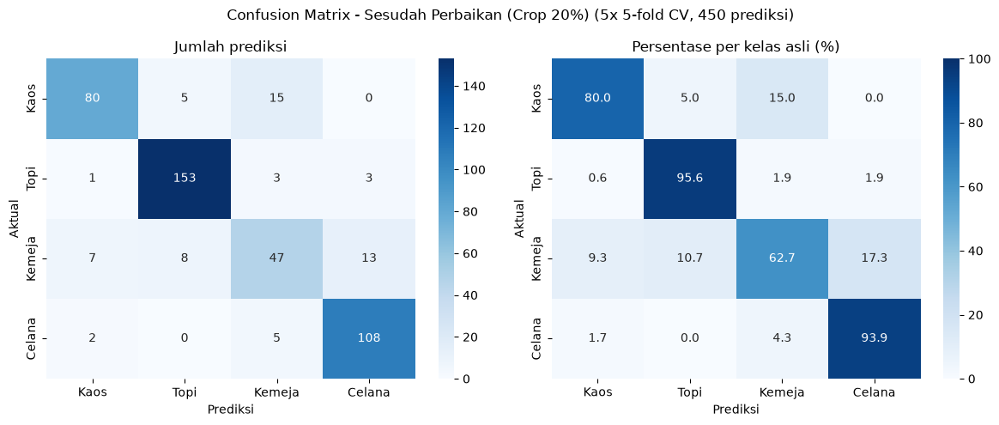

Tersimpan: C:\Semester 5\CV\SUBMISSION\Training Model\results\sesudah\results.md


In [18]:
AFTER_TITLE = f"Sesudah Perbaikan ({AFTER_NAME})"
res_after = ablation[AFTER_NAME]
after_intro = [
    "## Setup",
    f"- Konfigurasi: **{AFTER_NAME}**",
    f"- Center crop: margin {best_margin:.0%} tiap sisi, lalu resize {IMG_W}x{IMG_H}",
    f"- Augmentasi (jika dipakai): kelas {AUG_CLASSES}, flip horizontal, rotasi +/-{AUG_MAX_ANGLE} derajat, "
    f"brightness x{AUG_BRIGHTNESS[0]}-{AUG_BRIGHTNESS[1]} ({len(aug_data[0])} citra tambahan, hanya dari data training tiap fold)",
    f"- PCA (jika dipakai): n_components dipilih grid search dari {PCA_COMPONENTS} (proporsi varians)",
    f"- Model: StandardScaler + SVC (one-vs-one, class_weight=balanced); grid kernel {BASE_GRID['svm__kernel']}, C {BASE_GRID['svm__C']}",
    f"- Evaluasi: nested stratified {N_SPLITS}-fold CV, diulang {N_REPEATS}x",
    "",
    "## Ablation Study",
    md_table(["Konfigurasi", "Akurasi", "Std", "Selisih vs baseline", "F1 Kemeja"], ablation_rows),
]
images_after = np.stack([center_crop_resize(im, best_margin) for im in images_full])
ev_after = evaluate(res_after, AFTER_DIR, AFTER_TITLE, after_intro)

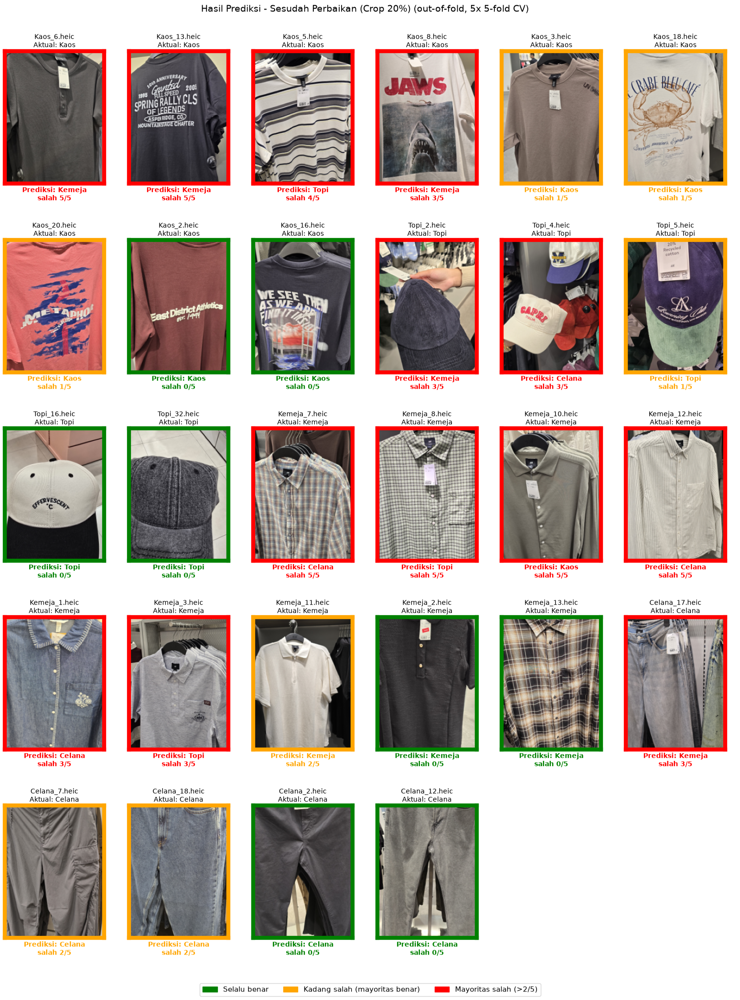

In [19]:
plot_predictions(ev_after, images_after, AFTER_DIR, AFTER_TITLE)

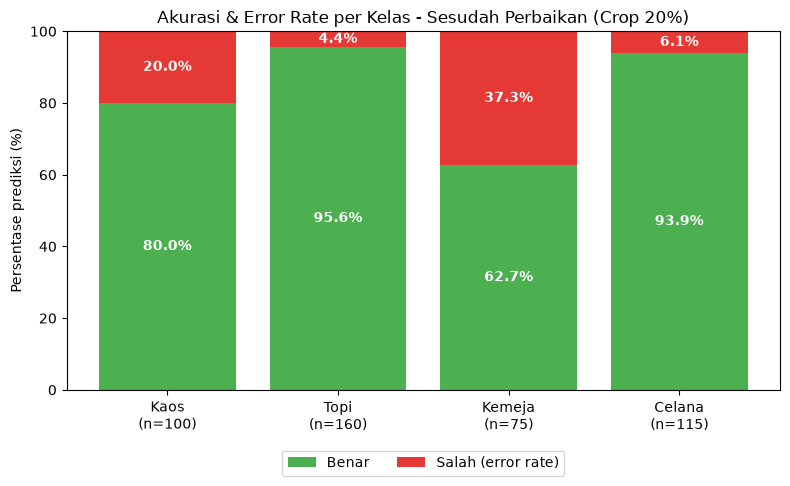

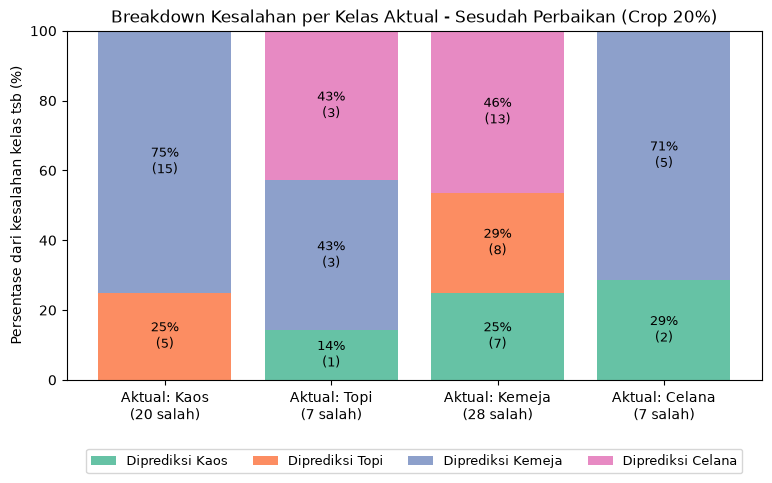

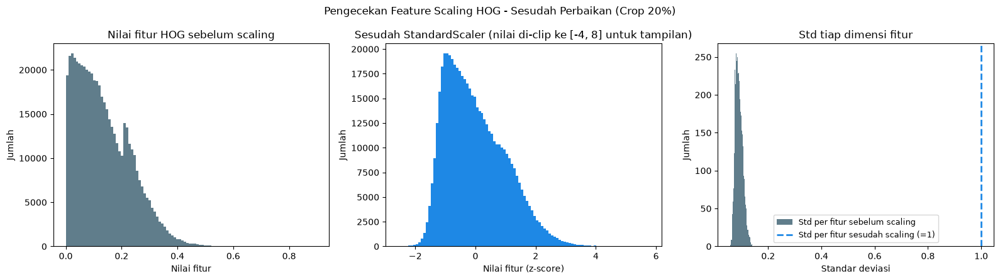

Sebelum scaling: mean 0.1360, std per fitur 0.0580-0.1435
Sesudah scaling: rata-rata mean per fitur 2.24e-18, rata-rata std per fitur 1.000


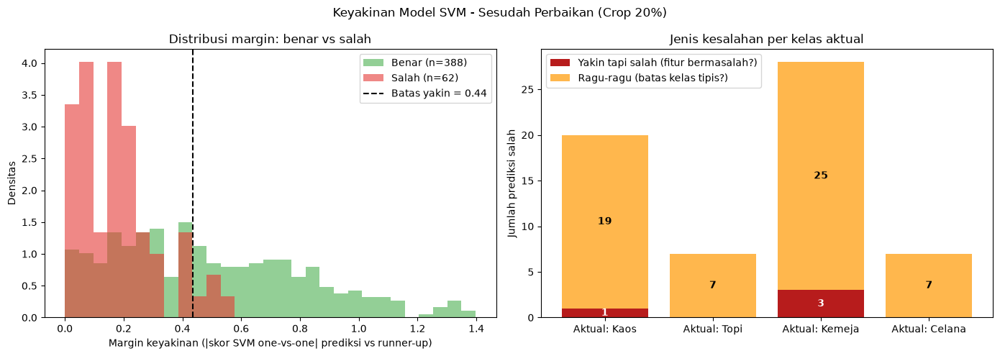

In [20]:
plot_diagnostics(res_after, ev_after, X_crop, AFTER_DIR, AFTER_TITLE)

## 9. Perbandingan Sebelum vs Sesudah

# Perbandingan Sebelum vs Sesudah Perbaikan

- Sebelum: HOG citra utuh -> akurasi **0.833 +/- 0.087**
- Sesudah: Crop 20% -> akurasi **0.862 +/- 0.082** (+2.9 poin)

## Ablation Study
| Konfigurasi | Akurasi | Std | Selisih vs baseline | F1 Kemeja |
|---|---|---|---|---|
| Baseline (tanpa crop) | 0.833 | 0.087 | +0.0 poin | 0.554 |
| Crop 10% | 0.851 | 0.097 | +1.8 poin | 0.662 |
| Crop 20% | 0.862 | 0.082 | +2.9 poin | 0.648 |
| Crop 20% + Augmentasi Kemeja | 0.784 | 0.103 | -4.9 poin | 0.577 |
| Crop 20% + PCA | 0.833 | 0.083 | +0.0 poin | 0.588 |
| Crop 20% + Augmentasi Kemeja + PCA | 0.778 | 0.089 | -5.6 poin | 0.541 |

## Metrik per Kelas (sebelum -> sesudah)
| Kelas | Precision | Recall | F1-score |
|---|---|---|---|
| Kaos | 0.811 -> 0.889 | 0.770 -> 0.800 | 0.790 -> 0.842 |
| Topi | 0.880 -> 0.922 | 0.963 -> 0.956 | 0.919 -> 0.939 |
| Kemeja | 0.655 -> 0.671 | 0.480 -> 0.627 | 0.554 -> 0.648 |
| Celana | 0.864 -> 0.871 | 0.939 -> 0.939 | 0.900 -> 0.904 |

## Perubahan Citra (ma

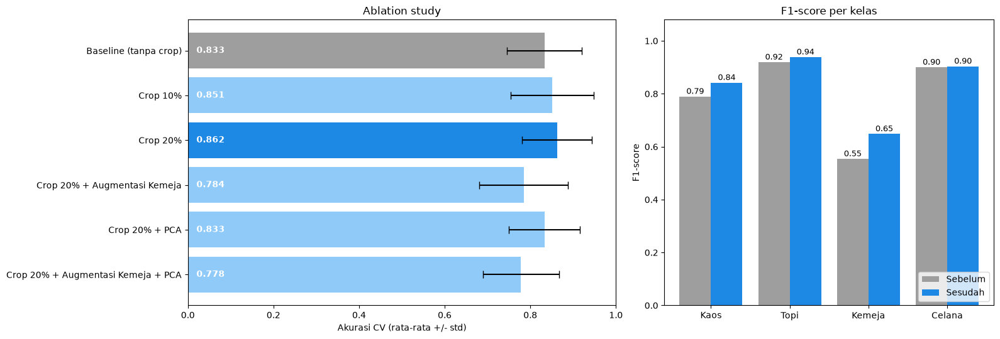

In [21]:
metrics = ["precision", "recall", "f1-score"]
class_rows = [
    (c, *(f"{ev_before['report'][c][m]:.3f} -> {ev_after['report'][c][m]:.3f}" for m in metrics))
    for c in CLASSES
]

# Citra yang berubah status (mayoritas salah = salah di lebih dari separuh ulangan)
wrong_before = ev_before["majority_wrong"]
wrong_after = ev_after["majority_wrong"]
fixed = [f"{filenames[i]} ({labels[i]})" for i in np.where(wrong_before & ~wrong_after)[0]]
broken = [f"{filenames[i]} ({labels[i]}, jadi {ev_after['shown_pred'][i]})" for i in np.where(~wrong_before & wrong_after)[0]]
still = [f"{filenames[i]} ({labels[i]})" for i in np.where(wrong_before & wrong_after)[0]]

acc_b, acc_a = res_before["fold_acc"], res_after["fold_acc"]
comparison = [
    "# Perbandingan Sebelum vs Sesudah Perbaikan",
    "",
    f"- Sebelum: HOG citra utuh -> akurasi **{acc_b.mean():.3f} +/- {acc_b.std():.3f}**",
    f"- Sesudah: {AFTER_NAME} -> akurasi **{acc_a.mean():.3f} +/- {acc_a.std():.3f}** "
    f"({(acc_a.mean() - acc_b.mean()) * 100:+.1f} poin)",
    "",
    "## Ablation Study",
    md_table(["Konfigurasi", "Akurasi", "Std", "Selisih vs baseline", "F1 Kemeja"], ablation_rows),
    "",
    "## Metrik per Kelas (sebelum -> sesudah)",
    md_table(["Kelas", "Precision", "Recall", "F1-score"], class_rows),
    "",
    f"## Perubahan Citra (mayoritas salah = salah > {N_REPEATS // 2} dari {N_REPEATS} ulangan)",
    f"- Diperbaiki (salah -> benar), {len(fixed)} citra: " + (", ".join(fixed) or "-"),
    f"- Jadi salah (benar -> salah), {len(broken)} citra: " + (", ".join(broken) or "-"),
    f"- Tetap salah, {len(still)} citra: " + (", ".join(still) or "-"),
    "",
    "Detail: `sebelum/results.md` dan `sesudah/results.md`. Grafik: `perbandingan.png`",
]
(OUTPUT_DIR / "perbandingan.md").write_text("\n".join(comparison), encoding="utf-8")
print("\n".join(comparison))

# Grafik: akurasi tiap konfigurasi ablation + F1 per kelas sebelum vs sesudah
fig, axes = plt.subplots(1, 2, figsize=(16, 5.5), gridspec_kw={"width_ratios": [1.3, 1]})
names = list(ablation)
means = [ablation[n]["fold_acc"].mean() for n in names]
stds = [ablation[n]["fold_acc"].std() for n in names]
colors = ["#9e9e9e" if n == "Baseline (tanpa crop)" else "#1e88e5" if n == AFTER_NAME else "#90caf9" for n in names]
axes[0].barh(names, means, xerr=stds, color=colors, capsize=4)
for yi, m in enumerate(means):
    axes[0].text(0.02, yi, f"{m:.3f}", va="center", color="white", fontweight="bold")
axes[0].invert_yaxis()
axes[0].set_xlim(0, 1)
axes[0].set_xlabel("Akurasi CV (rata-rata +/- std)")
axes[0].set_title("Ablation study")

x = np.arange(len(CLASSES))
f1_b = [ev_before["report"][c]["f1-score"] for c in CLASSES]
f1_a = [ev_after["report"][c]["f1-score"] for c in CLASSES]
axes[1].bar(x - 0.2, f1_b, width=0.4, color="#9e9e9e", label="Sebelum")
axes[1].bar(x + 0.2, f1_a, width=0.4, color="#1e88e5", label="Sesudah")
for xi, b, a in zip(x, f1_b, f1_a):
    axes[1].text(xi - 0.2, b + 0.01, f"{b:.2f}", ha="center", fontsize=9)
    axes[1].text(xi + 0.2, a + 0.01, f"{a:.2f}", ha="center", fontsize=9)
axes[1].set_xticks(x, CLASSES)
axes[1].set_ylim(0, 1.08)
axes[1].set_ylabel("F1-score")
axes[1].set_title("F1-score per kelas")
axes[1].legend(loc="lower right")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "perbandingan.png", dpi=200)
plt.show()